In [2]:

import  warnings
warnings.simplefilter('ignore')

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from mpl_toolkits import mplot3d
import graphviz

from sklearn.preprocessing import StandardScaler
from sklearn.metrics import auc, roc_curve, classification_report
from sklearn.svm import SVR
from sklearn.model_selection import GridSearchCV, train_test_split, KFold
from sklearn.ensemble import RandomForestRegressor
from sklearn import tree
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor

import h2o
from h2o.frame import H2OFrame
from h2o.estimators.random_forest import H2ORandomForestEstimator

%matplotlib inline

# 1. Load Dataset

In [3]:
## Read in data
data = pd.read_csv('Model Test Data.csv')
data.head()

,y,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10
0,58.891377,5285.076955,8102.610429,-142802.4627,0.731818,61045.686450,183502.7911,2418498.392,27880.60083,360626.7592,4
1,57.641838,2094.137183,7432.119245,-147434.0657,2.527586,48485.220290,232809.7287,1779351.332,32153.75776,382670.3624,5
2,53.746536,5830.245294,6613.941822,-129496.5961,2.625691,36301.747910,214837.0432,2072100.771,30642.70182,370120.6062,2
3,36.168986,13039.246420,5270.829420,-439972.8126,0.844833,-5909.877785,173613.1204,1899841.158,41311.52728,329891.8986,4
4,32.669772,4611.755026,3456.822275,-138594.7123,4.058533,37602.705370,228498.4096,1925463.972,27522.27266,473752.7977,3


In [4]:
data.describe() ## Checking for missing values and outliers.

,y,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10
count,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,1.000000e+04,10000.000000,10000.000000,10000.000000
mean,12.190351,8445.963010,3450.252510,168505.815510,1.610510,73390.402240,85873.402570,1.150636e+06,22190.066240,153862.395490,3.032500
std,16.020137,3540.407793,2544.552718,154606.758685,0.799212,42488.751840,71600.020020,8.840513e+05,9835.270071,84665.459925,1.410901
min,-20.486397,-5583.153749,-6338.250221,-439972.812600,-1.328607,-77050.448580,-162312.422300,-2.692945e+06,-12674.425590,-135125.465700,1.000000
25%,0.342919,6012.666381,1689.792306,64840.482335,1.070263,44707.280773,37958.405845,5.353268e+05,15593.819880,96818.711418,2.000000
50%,10.881019,8463.373285,3430.595022,167029.781400,1.598712,73543.761555,86582.980525,1.149984e+06,22091.102400,154089.232450,3.000000
75%,23.047831,10864.843605,5165.408836,272343.174250,2.146489,102189.829900,133951.621325,1.742196e+06,28924.445840,211875.685575,4.000000
max,94.749833,23299.976630,12288.699000,857156.728100,4.639956,242913.447400,357758.526300,4.315470e+06,58807.189120,473752.797700,5.000000


# 2. Data Exploration

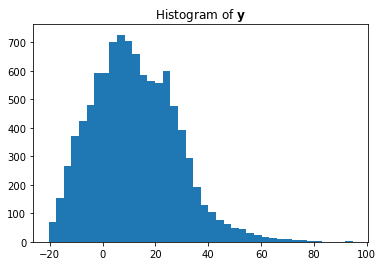

In [5]:
fig, ax = plt.subplots()
ax.hist(data['y'], bins = 40)
ax.set_title('Histogram of '+ r"$\bf{y}$")
plt.show()

In [6]:
X = np.array(data.drop('y', axis = 1))
# Checking multicollinearity
np.linalg.eig(np.matmul(np.matrix.transpose(X), X) )[0] # checking eigenvalues. 
# No multicollearity found

array([2.15866934e+16, 3.07671846e+14, 1.45305622e+14, 4.43110924e+13,
       3.73602583e+12, 1.69701476e+12, 6.30688876e+10, 3.41834161e+10,
       2.09288026e+04, 2.14023596e+03])

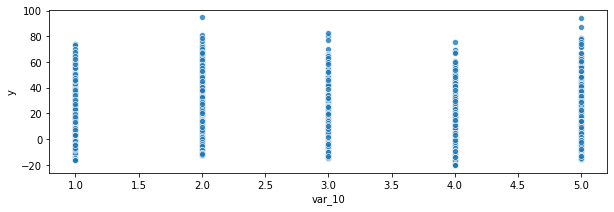

In [7]:
# Because there are only 10 predictors, let's plot y against each of them.
fig, ax = plt.subplots(figsize=(10, 3))

sns.scatterplot(data = data, x = 'var_10', 
                    y = 'y', alpha = .8)

The following is the scatter plot of `y` against each of the predictor variables. 

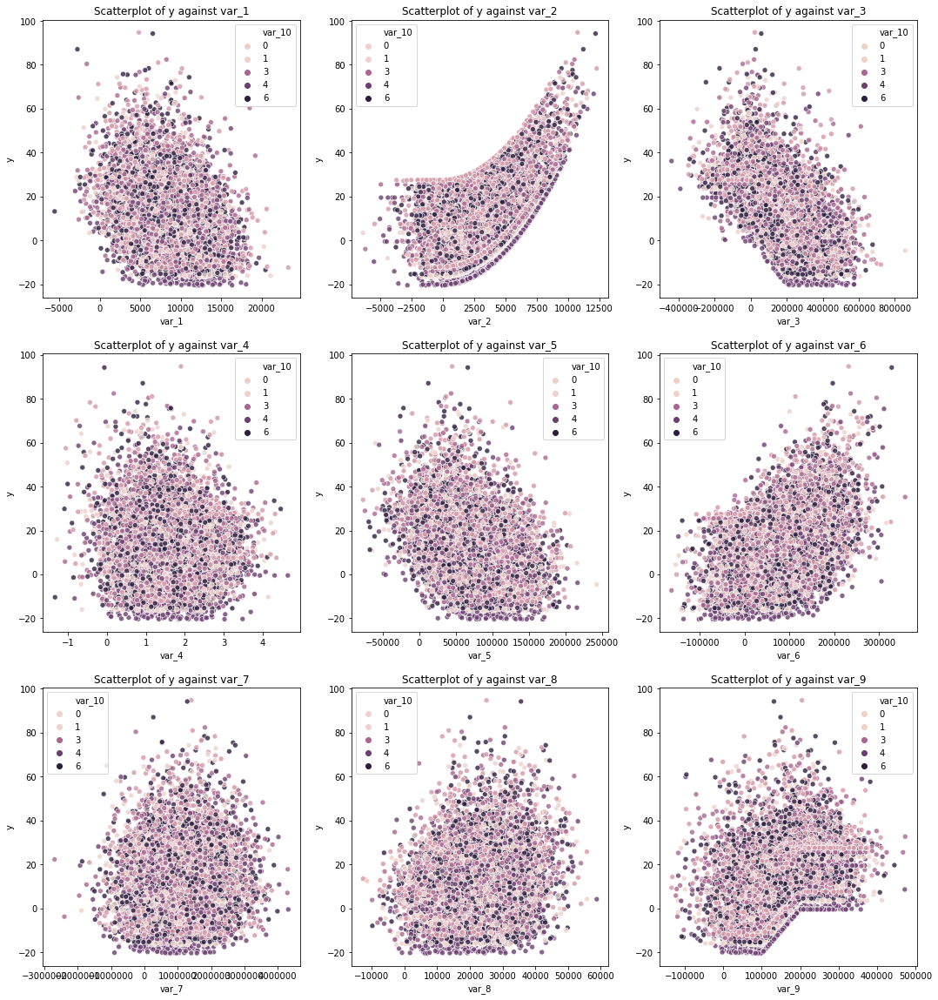

In [25]:
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(18, 20))
for i in range(1, 10):
    axes[(i-1) // 3][(i-1) % 3].set_title('Scatterplot of y against var_' + str(i))
    sns.scatterplot(data = data, x = 'var_' + str(i), 
                    y = 'y', hue = 'var_10', alpha = .8, ax = axes[(i-1) // 3][(i-1) % 3])

The following is the scatterplot of `y` against `var_i` multiplying `var_j`, where integer $i$: $1\le i\le 10$, and integer $j$: $1\le j\le 10$.

In [27]:
data1 = data.copy()
for i in range(1, 10):
    for j in range(1, 10):
        data1['var_'+str(i)+'_cross_var_' + str(j)] = data1['var_' + str(i)] * data1['var_' + str(j)]

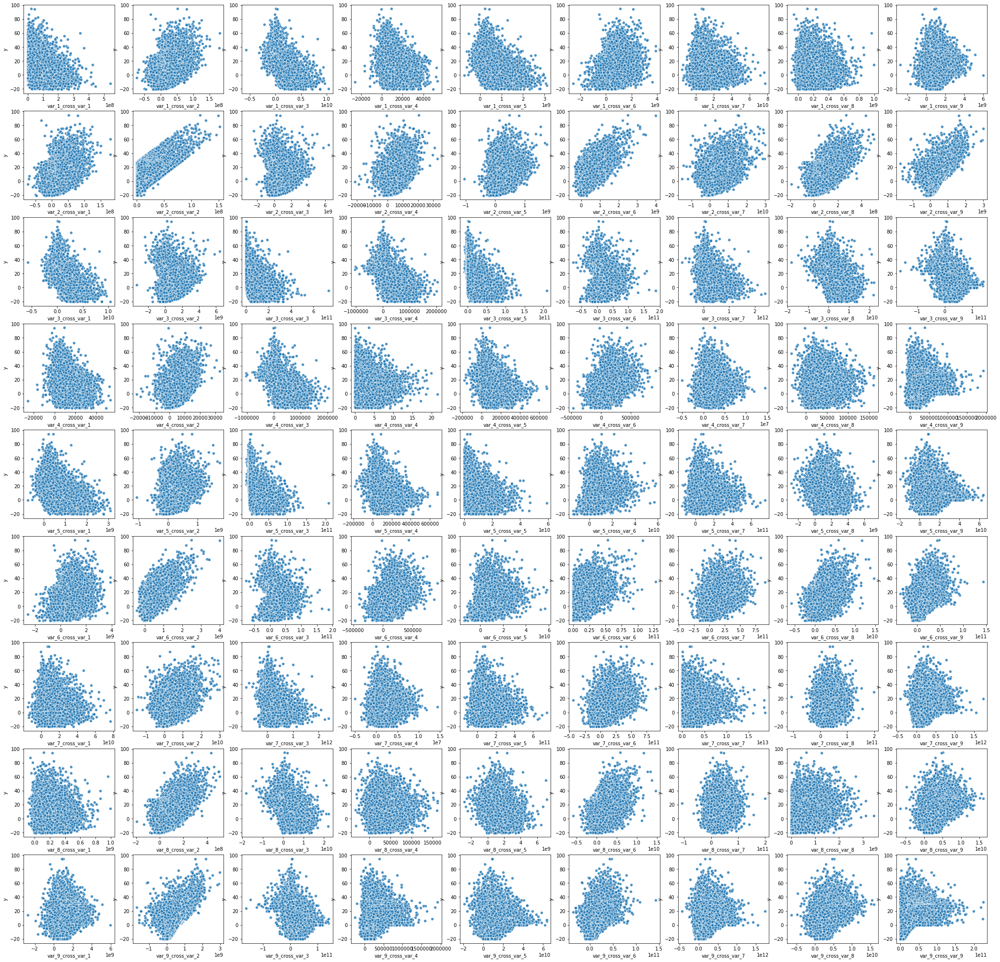

In [28]:
fig, axes = plt.subplots(nrows=9, ncols=9, figsize=(36, 36))
for i in range(1, 10):
    for j in range(1, 10):
        sns.scatterplot(data = data1, x = 'var_' + str(i) + '_cross_var_'+str(j), 
                    y = 'y',  alpha = .8, ax = axes[i - 1][j - 1])

# 3. Modeling

## 3.1. Full Random Forest Regression Model

First, a random forest model with all columns is fit:

In [31]:
X_train, X_test, y_train, y_test = train_test_split(data.drop(['y'], axis = 1), data['y'], 
                                                   test_size = .2)

In [32]:
# With no clear pattern detected, let's fit a random forest and check for feature importances.
rfr = RandomForestRegressor(n_estimators = 80, criterion = 'mse', random_state= 8, oob_score  = True)
rfr.fit(X_train, y_train)

RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=None, max_features='auto', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=80, n_jobs=None, oob_score=True,
                      random_state=8, verbose=0, warm_start=False)

In [33]:
print(rfr.oob_score_)
# This is the R_squared on out-of-bag training data.

0.9871925254515754


In [34]:
data.shape

(10000, 11)

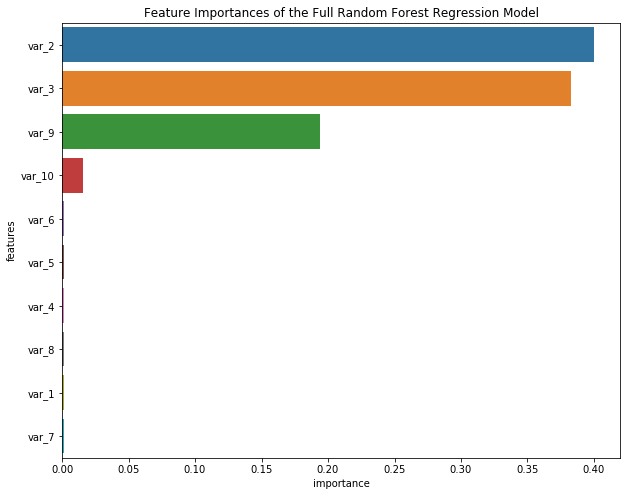

In [35]:
importance = rfr.feature_importances_
features = ['var_'+str(x) for x in range(1, 11)]

importanceDF = pd.DataFrame(data = {'importance': importance, 'features': features})
importanceDF = importanceDF.sort_values(by = 'importance', ascending = False)
fig, ax = plt.subplots(figsize=(10, 8))
sns.barplot(x='importance', y='features', data=importanceDF)
ax.set_title('Feature Importances of the Full Random Forest Regression Model')
plt.show()

In [36]:
np.mean((rfr.predict(X_test) - y_test)**2)
# This is the RSE on testing data.
# Given the magnitude of the response variable y, this is actually pretty impressive!

3.14290584170601

Text(0.5, 1.0, 'Predicted Y value by Actual Y value on Testing Data, Full Model')

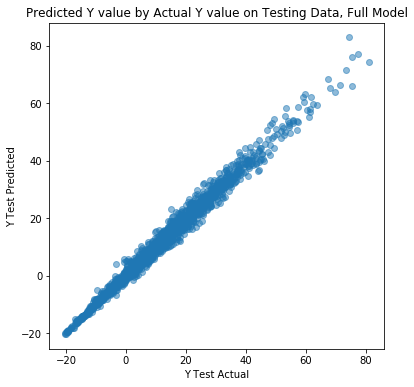

In [37]:
fig, ax = plt.subplots(figsize = (6, 6))
ax.scatter(y_test, rfr.predict(X_test), alpha = .5)
ax.set_xlabel('Y Test Actual')
ax.set_ylabel('Y Test Predicted')
ax.set_title("Predicted Y value by Actual Y value on Testing Data, Full Model")

The result is very good. But it seems that some of the preditors are not used. Let's remove them. 

## 3.2. Restricted Random Forest Regression Model

`var_2`, `var_3`, `var_9`, and `var_10` dominate the feature importances. Now, let's try to build another random forest model with only these four variables and see what we get. 

In [38]:
rfr2 = RandomForestRegressor(oob_score = True)
rfr2.fit(X_train[['var_2', 'var_3', 'var_9', 'var_10']], y_train)

RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=None, max_features='auto', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=100, n_jobs=None, oob_score=True,
                      random_state=None, verbose=0, warm_start=False)

In [39]:
rfr2.oob_score_


0.9903424635506187

In [40]:
np.mean((rfr2.predict(X_test[['var_2', 'var_3', 'var_9', 'var_10']]) - y_test)**2)

2.476725960119054

Text(0.5, 1.0, 'Predicted Y value by Actual Y value on Testing Data, Reduced Model')

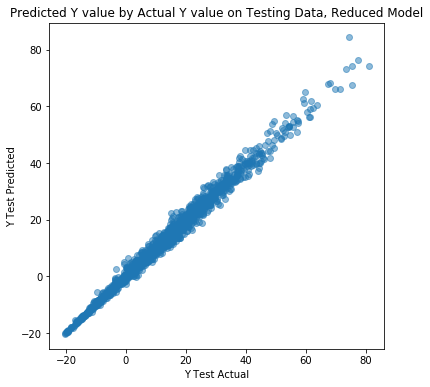

In [41]:
fig, ax = plt.subplots(figsize = (6, 6))
ax.scatter(y_test, rfr2.predict(X_test[['var_2', 'var_3', 'var_9', 'var_10']]), alpha = .5)
ax.set_xlabel('Y Test Actual')
ax.set_ylabel('Y Test Predicted')
ax.set_title("Predicted Y value by Actual Y value on Testing Data, Reduced Model")

Text(0.5, 1.0, 'Residual Plot on Testing Data, Reduced Model')

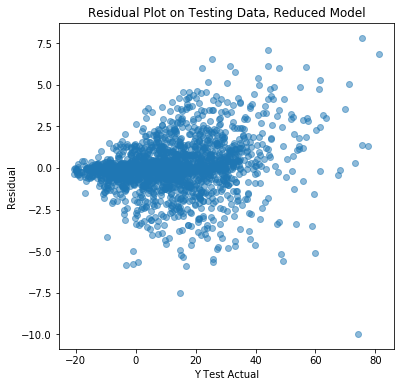

In [42]:
## Now I attempt to find out the analytical form of the pattern.
## First, I convert Y variable into categorical
fig, ax = plt.subplots(figsize = (6, 6))
ax.scatter(y_test, y_test-rfr2.predict(X_test[['var_2', 'var_3', 'var_9', 'var_10']]), alpha = .5)
ax.set_xlabel('Y Test Actual')
ax.set_ylabel('Residual')
ax.set_title("Residual Plot on Testing Data, Reduced Model")

Let's also build a single tree to visualize how the regression was performed.



In [51]:
singleTree = DecisionTreeRegressor(max_depth = 4, min_samples_leaf = 30, random_state = 6)
singleTree.fit(X_train[['var_2', 'var_3', 'var_9', 'var_10']], y_train)

DecisionTreeRegressor(ccp_alpha=0.0, criterion='mse', max_depth=4,
                      max_features=None, max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=30, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, presort='deprecated',
                      random_state=6, splitter='best')

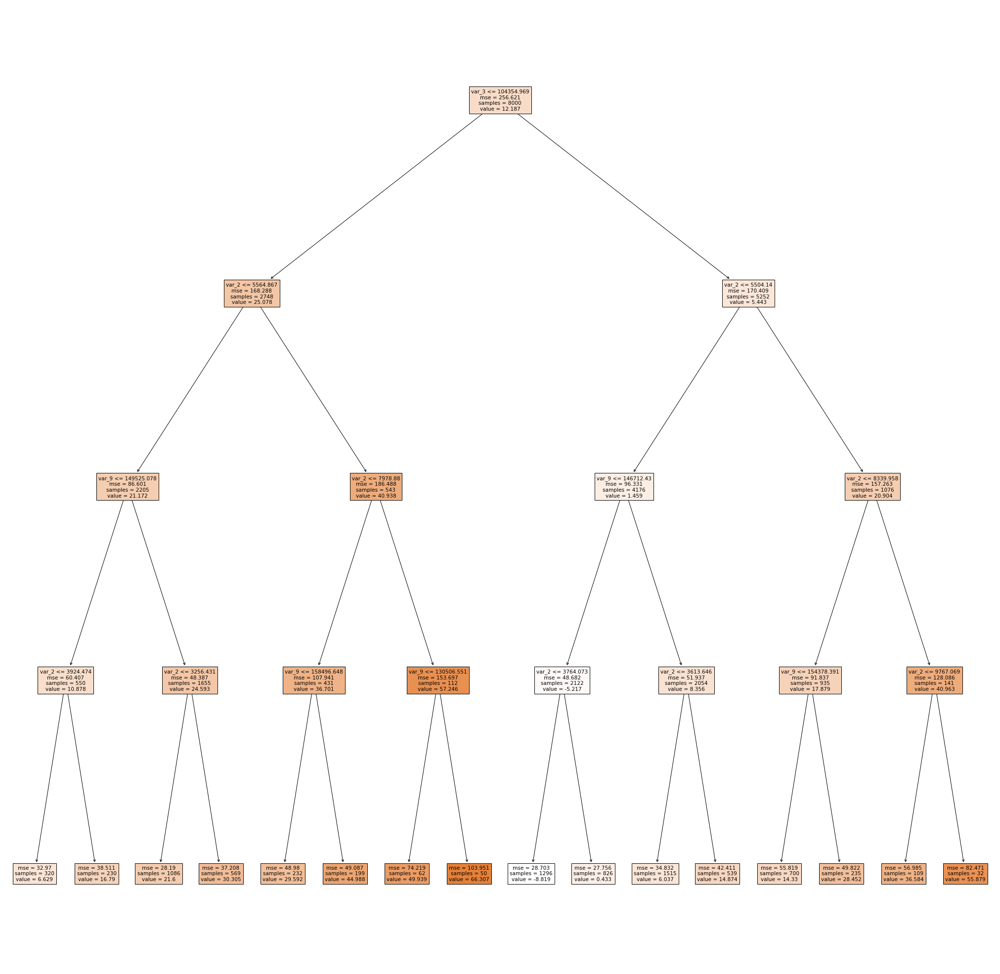

In [52]:
fig, ax = plt.subplots(figsize = (36, 36))
_ = tree.plot_tree(singleTree, 
                   feature_names=['var_2', 'var_3', 'var_9', 'var_10'],  
                   
                   filled=True)
plt.show()

With the random forest regression model, we have so far done very good in terms of prediction.

However, I am still curious what is the relationship between the variables, and would like to try to find an analytical form.

## 5.3. Linear Regression
Because we only have 4 predictor variables, I will transform the variables and perform model selection.

For this step, I will use `R`, since I am more familiar with `R` for this procedure.
### 5.3.1. Feature Engineering (in R)
### 5.3.2. Variable Selection (in R)



# 6. Conclusion
 
Following our modeling with linear regression, it seems that the true relationship is 

$$y = \beta_0 + h(var_{10})(\beta_1var_2+\beta_2var_2^2+\beta_3var_3I(var_3\le200000)+\beta_9var_9I(100000<var_9\le200000),$$

where $h(var_{10}）$ remains to be modeled in further research. 

# 7. Additional graphing/modeling attempts

The following exploration is done by way of exploration, and is not intended to be part of the report. 

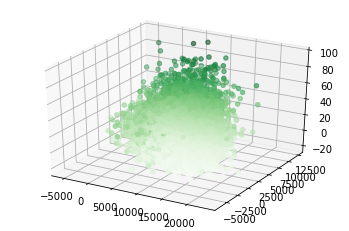

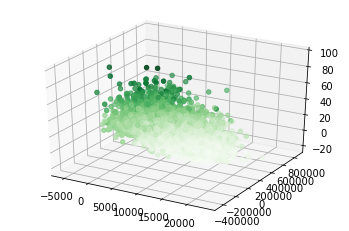

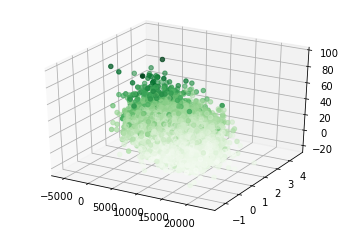

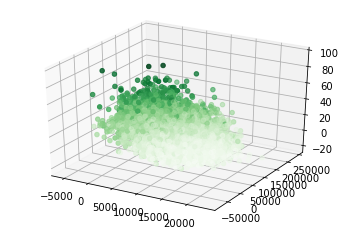

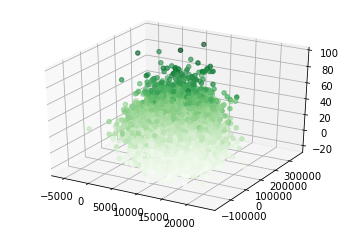

...

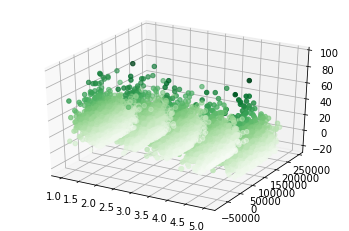

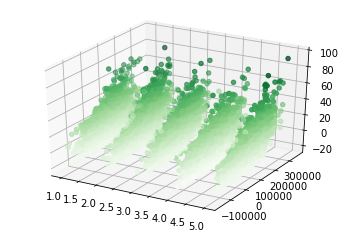

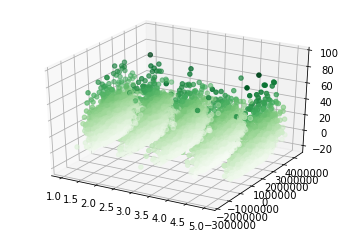

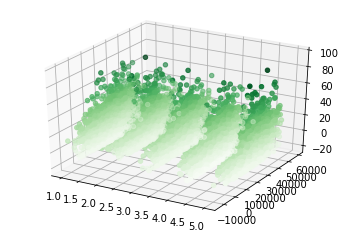

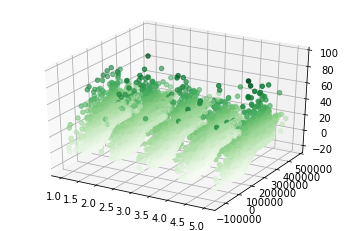

In [27]:
# Attempting to plot 3d scatterplot with y against two predictors:

for i in range(1, 11):
    for j in range(1, 11):
        if i != j:
            ax = plt.axes(projection='3d')
            ax.scatter3D(data['var_' + str(i)], data['var_'+str(j)], data['y'], c=data['y'], cmap='Greens')
            plt.show()



Feature engineering did product any result. Given the mysterious nature of the model, I'm going to feed the data into a support vector classifier and see what happens.